# Shared Latent Neural ODE Reduced-Order Modeling from Multi-Fidelity Offline Data

This document presents the current `mf_lnode` library in the form of a concise scientific paper. The
objective is to make the methodological choices, synthetic test problems, and present empirical evidence
readable without requiring parallel inspection of the source tree. All figures displayed below are generated
directly from the example pipelines shipped with the repository.


## Abstract

This work studies reduced-order modeling from offline multi-fidelity trajectory data under the hypothesis
that multiple fidelities correspond to different observations of the same underlying parameterized dynamics.
The implemented model learns a shared latent state, a shared parameter-conditioned latent Neural ODE, and
fidelity-specific observation maps built around shared autoencoding structure. Short temporal windows are
encoded into latent initial conditions, propagated through the latent ODE, and decoded back into the
requested fidelity.

Two synthetic studies are used to probe the formulation. The first considers a low-dimensional latent system
observed through a high-dimensional measurement process, where low fidelity is generated by a structured
nonlinear bias rather than by additive noise alone. The second considers a CFD-like time-dependent scalar
field observed on different spatial grids, with coarse low-fidelity outputs and fine high-fidelity outputs.
The first study isolates shared latent representation under observation bias; the second isolates shared
latent dynamics under output-space mismatch.

The present results support the claim that the library already captures a coherent multifidelity latent ROM
formulation. At the same time, the experiments indicate that the next scientifically meaningful gains are
likely to come from cleaner loss design, stronger spatial inductive bias, and more systematic evaluation
rather than from indiscriminately increasing architectural complexity.


## 1. Introduction

Multi-fidelity dynamical data arise naturally whenever the same physical system can be observed or simulated
at different costs and different levels of accuracy. Typical examples include coarse versus fine numerical
solvers, low-resolution versus high-resolution observation operators, and approximate surrogate trajectories
paired with a smaller number of trusted reference trajectories. In such settings, it is often undesirable to
fit independent models to each fidelity, because doing so discards the scientific assumption that all
observations are generated by the same physical process.

The present library adopts the opposite point of view. It assumes that the dominant dynamics should be
represented in a shared latent state space, while fidelity-specific effects should be represented primarily
in the observation and reconstruction maps. This is a natural reduced-order modeling hypothesis: the latent
state should encode the evolving physical degrees of freedom, and fidelity should account for how those
degrees of freedom are measured, discretized, or biased.

The purpose of the current implementation is not yet to solve the full multifidelity ROM problem in its most
general form. Instead, it provides a disciplined first milestone: offline learning, shared latent dynamics,
fidelity-aware encoders and decoders, paired or partially paired trajectory groups, and a training pipeline
that allows low-fidelity data to support representation learning while letting high fidelity define the final
target behavior.


## 2. Problem Setting and Notation

Let $f \in \mathcal{F}$ denote a fidelity index and let $\mu \in \mathbb{R}^{d_\mu}$ denote the system
parameter vector. For one physical trajectory instance $i$, the observed offline data are

$$
\mathcal{D}_i =
\left\{
\left(t_n^{(f)}, x_i^{(f)}(t_n^{(f)}), \mu_i\right)
\right\}_{f \in \mathcal{F}}.
$$

Some instances are fully paired across fidelities, while others are only partially observed. The library
therefore works with grouped trajectory objects: one grouped sample corresponds to one parameter vector and
one physical trajectory identity, together with whichever fidelities are available for that instance.

The learning task is to construct a reduced-order model that supports:

- encoding short observation windows into latent initial conditions
- rolling those latent states forward in time
- reconstructing trajectories at one or more fidelities
- exploiting low-fidelity data during training without giving up high-fidelity accuracy

The current scope is restricted to offline supervised learning. Online adaptation, uncertainty
quantification, multimodal fusion, and solver-coupled PDE integration are intentionally outside the present
boundary.


## 3. Method

The implemented model family is summarized by

$$
z_0 = E_f\left(x^{(f)}_{t_0:t_k}, \mu\right), \qquad
\dot{z} = g_\theta(z, \mu), \qquad
\hat{x}^{(f)}(t) = D_f\left(z(t), \mu\right),
$$

where $E_f$ is a fidelity-aware temporal encoder, $g_\theta$ is a shared parameter-conditioned latent
vector field, and $D_f$ is a fidelity-specific decoder. The encoder operates on a short temporal window
rather than on a single snapshot so that the inferred latent initial condition is less underdetermined.

The architecture combines five ingredients.

1. Fidelity-specific observation adapters accommodate input dimensions and local statistics that vary across
   fidelities.
2. A shared temporal backbone extracts a common hidden representation from windowed trajectories.
3. A shared latent projector maps all fidelities into one latent coordinate system.
4. A shared Neural ODE advances the latent state under parameter conditioning.
5. Fidelity-specific decoders reconstruct the desired output representation.

For same-grid settings, the decoder may optionally use a hierarchical form,

$$
\hat{x}^{(h)}(t) = D_{\ell}(z(t), \mu) + \Delta_{h \leftarrow \ell}(z(t), \mu),
$$

in which the high-fidelity reconstruction is expressed as a low-fidelity base prediction plus an additive
discrepancy term. For different-grid settings, separate decoder heads are used because the output
dimensions differ.

A crucial methodological point is that the latent coordinates are not directly supervised. Even if the
latent dimension is chosen to match the intrinsic order of the physical system, the learned latent state is
generally identified only up to an invertible change of coordinates induced by the encoder-decoder pair. The
model can therefore recover a latent trajectory that is dynamically equivalent to the true physical state
without recovering the literal physical coordinates themselves.


## 4. Training Objective and Optimization Strategy

The default objective is

$$
\mathcal{L} =
\lambda_{\mathrm{roll}} \mathcal{L}_{\mathrm{roll}}
+ \lambda_{\mathrm{latent}} \mathcal{L}_{\mathrm{latent-cons}}
+ \lambda_{\mathrm{align}} \mathcal{L}_{\mathrm{latent-align}}
+ \lambda_{\mathrm{mf}} \mathcal{L}_{\mathrm{mf}}
+ \lambda_{\mathrm{disc}} \mathcal{L}_{\mathrm{disc}}
+ \lambda_{\mathrm{reg}} \mathcal{L}_{\mathrm{reg}}.
$$

The terms have the following meaning.

- $\mathcal{L}_{\mathrm{roll}}$ penalizes observation-space rollout error.
- $\mathcal{L}_{\mathrm{latent-cons}}$ penalizes disagreement between propagated latent states and latent
  states re-encoded from later windows.
- $\mathcal{L}_{\mathrm{latent-align}}$ penalizes mismatch between paired low- and high-fidelity latent
  states and, when possible, their latent trajectories.
- $\mathcal{L}_{\mathrm{mf}}$ applies fidelity-dependent weighting to reconstruction.
- $\mathcal{L}_{\mathrm{disc}}$ regularizes the discrepancy decoder when the hierarchical decoder is used.
- $\mathcal{L}_{\mathrm{reg}}$ controls latent magnitude and latent roughness.

The fidelity schedule is an essential part of the method. Low-fidelity observations are weighted more
strongly during early optimization, whereas the influence of high fidelity increases later. This curriculum
operationalizes the intended scientific bias: abundant low-fidelity data should shape the shared
representation, but the final target behavior should be anchored by the high-fidelity trajectories.

One methodological caveat remains. In the present implementation, observation accuracy is penalized both by
the rollout term and by the fidelity-weighted reconstruction term. This is acceptable for exploratory work,
but a more mature research formulation should separate these roles more cleanly.


### 4.1 Forecasting Protocol and Interpretation

In this library, forecasting begins after a short context window has been encoded into a latent initial
condition. The latent Neural ODE is then integrated forward over future times without access to future
observations. Decoding is performed directly from the latent rollout. The prediction is therefore open-loop
once the context window has been consumed: there is no teacher forcing, no recurrent correction in
observation space, and no data assimilation after the initial encoding step.

Two forecast regimes appear in the figures.

- **Windowed forecast:** the same short-horizon prediction regime used during training.
- **Full open-loop rollout:** one initial context window is encoded, and the model predicts the remainder of
  the trajectory in latent space before decoding.

The forecast figures should be read accordingly.

- The **window rollout** figure measures local predictive accuracy over the horizon optimized during
  training.
- The **full-trajectory rollout** figure measures how far the learned latent dynamics remain stable and
  useful when propagated over much longer horizons.
- The **rollout error profile** figure shows how prediction error grows as a function of forecast time.
- The **fidelity-gap** figure tests whether the model forecasts the cross-fidelity relationship, not only
  each fidelity independently.

A second caveat is important for interpretation. The examples shipped in the repository use a random split by
grouped sample identity, not a strict parameter-holdout split. The forecast results therefore demonstrate
generalization to held-out trajectories drawn from the same parameter distribution, not extrapolation to
previously unseen regions of parameter space.


## 5. Experimental Design

Two complementary studies are used throughout this document.

- **Study I: nonlinear multi-fidelity sensing.** Both fidelities represent the same conceptual quantity, but
  the low-fidelity measurements are produced by a strongly biased nonlinear observation map.
- **Study II: different-grid CFD-like fields.** Low and high fidelity correspond to the same evolving scalar
  field sampled on different spatial grids, with additional low-fidelity distortion.

These studies are not redundant. The first is more informative about cross-fidelity latent alignment under
observation bias. The second is more informative about whether the same latent reduced-order model can
support fidelities with different output dimensions and different spatial discretizations.


In [1]:
from pathlib import Path
import json
import os
import subprocess
import sys

from IPython.display import Image, Markdown, display


def find_project_root() -> Path:
    cwd = Path.cwd().resolve()
    for candidate in [cwd, *cwd.parents]:
        if (candidate / "pyproject.toml").exists() and (candidate / "examples").exists():
            return candidate
    raise RuntimeError("Could not find the project root from the current working directory.")


PROJECT_ROOT = find_project_root()
os.chdir(PROJECT_ROOT)
print(f"Project root: {PROJECT_ROOT}")


def run_example(script_name: str, output_dir: Path, epochs: int, quick: bool, force: bool = False) -> Path:
    output_dir = Path(output_dir)
    metrics_path = output_dir / "test_metrics.json"
    if metrics_path.exists() and not force:
        print(f"Reusing existing artifacts in {output_dir}")
        return output_dir

    cmd = [
        sys.executable,
        str(PROJECT_ROOT / "examples" / script_name),
        "--output-dir",
        str(output_dir),
        "--epochs",
        str(epochs),
    ]
    if quick:
        cmd.append("--quick")

    print("Running:", " ".join(cmd))
    subprocess.run(cmd, cwd=PROJECT_ROOT, check=True)
    return output_dir


def load_metrics(output_dir: Path) -> dict[str, float]:
    return json.loads((Path(output_dir) / "test_metrics.json").read_text())


def display_png(path: Path, caption: str | None = None, width: int = 1200) -> None:
    path = Path(path)
    if caption:
        display(Markdown(f"*Figure.* {caption}"))
    display(Image(filename=str(path), width=width))


def display_figure_group(output_dir: Path, items: list[tuple[str, str]], width: int = 1200) -> None:
    output_dir = Path(output_dir)
    for filename, caption in items:
        display_png(output_dir / filename, caption=caption, width=width)


def metrics_markdown(metrics: dict[str, float]) -> str:
    rows = ["| Metric | Value |", "|---|---:|"]
    for key, value in sorted(metrics.items()):
        rows.append(f"| `{key}` | {value:.6f} |")
    return "\n".join(rows)


Project root: /Users/filippozacchei/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Documenti/Projects/2026_MFSINDY2/mfaesindy


In [2]:
FORCE_RERUN = False
USE_QUICK_MODE = False

SYNTHETIC_EPOCHS = 1 if USE_QUICK_MODE else 12
CFD_EPOCHS = 1 if USE_QUICK_MODE else 12

SYNTHETIC_OUTPUT = PROJECT_ROOT / "artifacts" / "notebook_synthetic"
CFD_OUTPUT = PROJECT_ROOT / "artifacts" / "notebook_cfd_like_grids"

print("Quick mode:", USE_QUICK_MODE)
print("Synthetic artifacts:", SYNTHETIC_OUTPUT)
print("CFD-like artifacts:", CFD_OUTPUT)
print("For paper-quality figures, keep USE_QUICK_MODE=False. If stale quick artifacts exist, set FORCE_RERUN=True.")


Quick mode: False
Synthetic artifacts: /Users/filippozacchei/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Documenti/Projects/2026_MFSINDY2/mfaesindy/artifacts/notebook_synthetic
CFD-like artifacts: /Users/filippozacchei/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Documenti/Projects/2026_MFSINDY2/mfaesindy/artifacts/notebook_cfd_like_grids
For paper-quality figures, keep USE_QUICK_MODE=False. If stale quick artifacts exist, set FORCE_RERUN=True.


## 6. Study I: Nonlinear Multi-Fidelity Sensing

The first study uses deliberately simple latent physics and deliberately difficult observations. The hidden
state is a damped oscillator parameterized by $(\mu_0, \mu_1)$, but the model never observes those latent
coordinates directly. Instead, the latent state is lifted to a 12-channel observation space containing both
interpretable channels and nonlinear sensor-like channels. The low-fidelity observations are then generated
by a structured nonlinear bias map involving temporal lag, channel mixing, saturation, multiplicative
interactions, and parameter-dependent drift.

The scientific question is therefore narrow and important: can a shared latent state and a shared latent ODE
still be learned when low and high fidelity differ primarily in how the same dynamics are measured?


### 6.1 Data Construction and Measurement Model

The study is designed so that low fidelity is not simply a noisier version of high fidelity. The latent
oscillator is first lifted into a higher-dimensional measurement vector. The first channels remain
interpretable, while the remaining channels include products, quadratic terms, bounded nonlinearities, and
parameter- or time-dependent modulations. Low fidelity is then produced by an additional nonlinear bias map.

As a consequence, success in this study should be interpreted as evidence about cross-fidelity latent
alignment under observation bias, not merely as success under corrupted data.

In this study the latent dimension is set to `2`, equal to the intrinsic order of the damped oscillator.
This choice is made for interpretability and for a fair reduced-order comparison with the known synthetic
dynamics. It should not be confused with latent supervision: the model is still trained only from
observations, so there is no explicit term forcing the learned latent coordinates to equal the true
displacement-velocity pair.

The concrete dataset specification used in the example is:

- `24` paired groups, `8` low-only groups, and `4` high-only groups
- damping parameter sampled uniformly from `[0.05, 0.25]`
- frequency parameter sampled uniformly from `[0.8, 1.6]`
- `96` uniform time samples on `[0, 12]`
- high-fidelity observation dimension `12`
- additive Gaussian noise with standard deviation `0.02` for high fidelity and `0.08` for low fidelity

The data are generated in two steps. First, the true latent oscillator state $[q(t), v(t)]$ is simulated
and lifted into a 12-channel measurement vector. The first channels remain directly interpretable, while the
remaining channels include products such as $qv$, quadratic terms such as $q^2$ and $v^2$, bounded
nonlinearities, energy-like quantities, and parameter/time-modulated channels. Second, low fidelity is
generated from those high-fidelity measurements by a structured bias map that introduces temporal lag,
cross-channel mixing, nonlinear compression, multiplicative interaction terms, and parameter/time dependent
drift. The first study is therefore a genuine multifidelity representation problem rather than a denoising
task.


In [3]:
run_example(
    "train_synthetic.py",
    SYNTHETIC_OUTPUT,
    epochs=SYNTHETIC_EPOCHS,
    quick=USE_QUICK_MODE,
    force=FORCE_RERUN,
)
synthetic_metrics = load_metrics(SYNTHETIC_OUTPUT)
display(Markdown("Artifacts for Study I are available."))


Reusing existing artifacts in /Users/filippozacchei/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Documenti/Projects/2026_MFSINDY2/mfaesindy/artifacts/notebook_synthetic


Artifacts for Study I are available.

*Figure.* Study I test problem: latent oscillator dynamics, representative paired trajectory, and phase-space behavior.

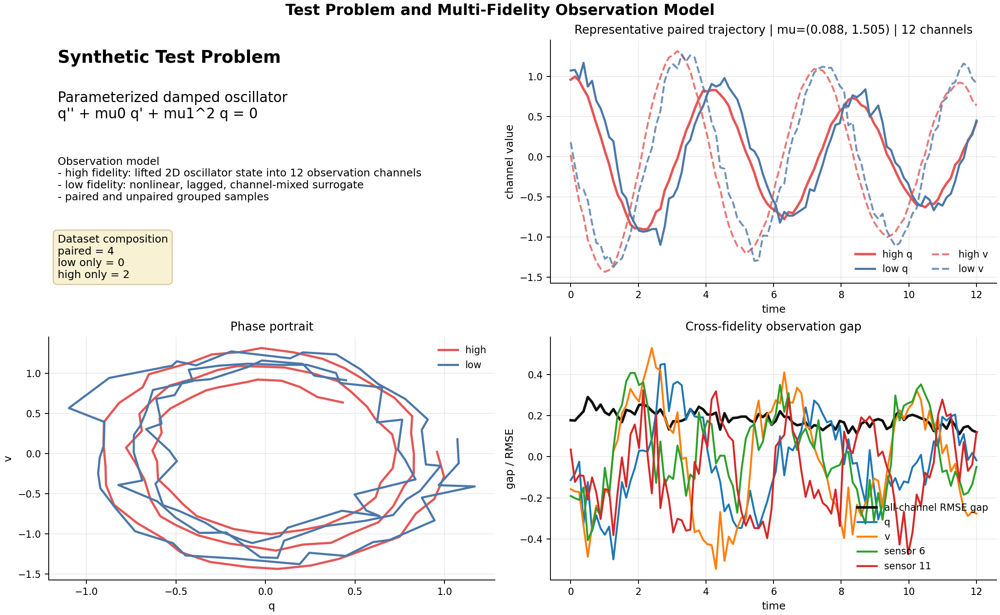

*Figure.* Study I measurement model: channel definitions, representative traces, and low-to-high measurement bias.

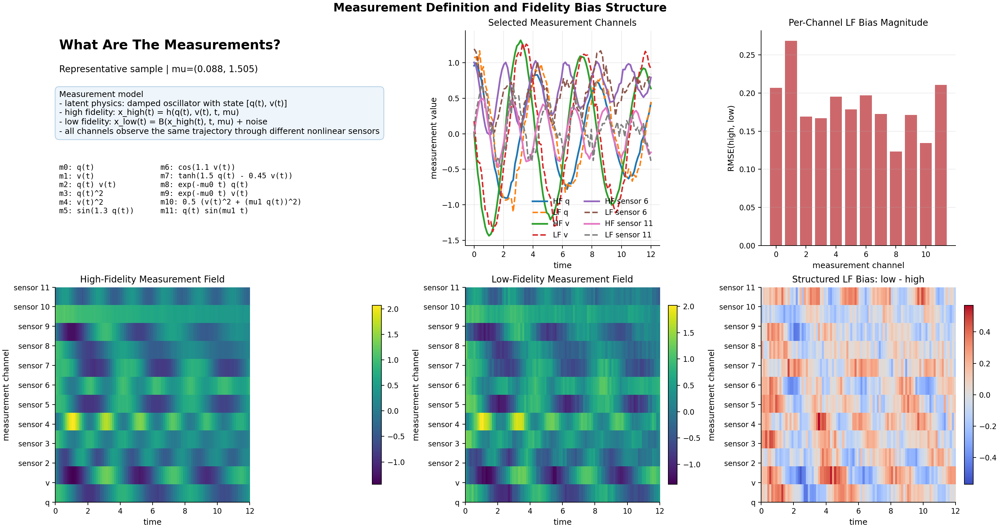

*Figure.* End-to-end workflow from windowed observations to latent rollout and fidelity-specific reconstruction.

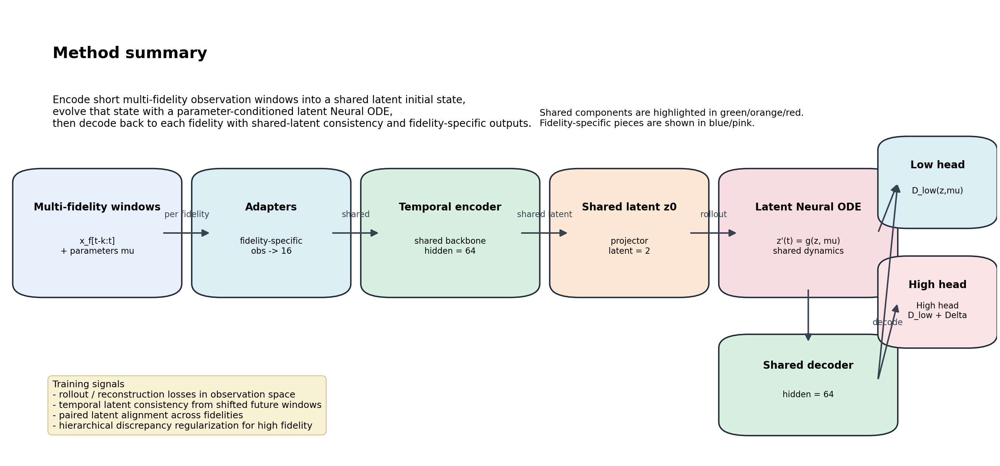

*Figure.* Allocation of shared and fidelity-specific modules in the implemented architecture.

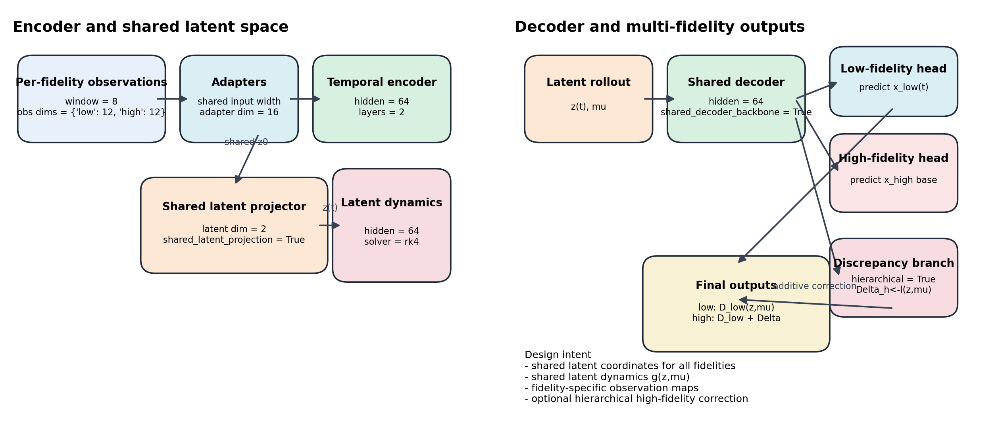

*Figure.* Loss decomposition and fidelity-weight curriculum used during optimization.

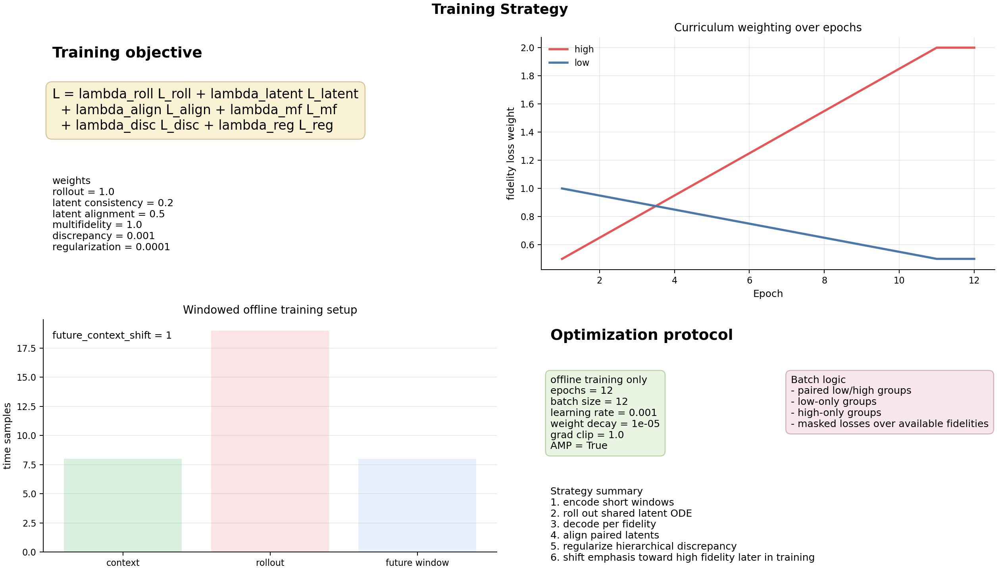

In [4]:
display_figure_group(
    SYNTHETIC_OUTPUT,
    [
        ("01_test_problem.png", "Study I test problem: latent oscillator dynamics, representative paired trajectory, and phase-space behavior."),
        ("02_measurement_overview.png", "Study I measurement model: channel definitions, representative traces, and low-to-high measurement bias."),
        ("03_method_overview.png", "End-to-end workflow from windowed observations to latent rollout and fidelity-specific reconstruction."),
        ("04_architecture_breakdown.png", "Allocation of shared and fidelity-specific modules in the implemented architecture."),
        ("05_training_strategy.png", "Loss decomposition and fidelity-weight curriculum used during optimization."),
    ],
    width=1100,
)


### 6.2 Interpretation of the Setup Figures

The measurement figure is especially important. It makes clear that the observed channels are not abstract
feature indices but structured measurements derived from the latent physical state. This distinction matters
because it justifies the claim that the model is learning a representation of shared dynamics rather than
merely compressing unrelated vectors.

The architecture figure should be read as the methodological core of the study. The model does not give each
fidelity its own latent dynamics. Instead, it assumes one latent dynamical law and allows fidelity to enter
through the encoders and decoders. The training-strategy figure then explains how the curriculum uses
low-fidelity data early in optimization while shifting authority toward high fidelity later.


### 6.3 Identifiability Remark

Because the synthetic oscillator has a true two-dimensional hidden state, it is tempting to read the learned
latent trajectory as though it were the true physical trajectory. That interpretation would be too strong.
The autoencoding model is not given latent supervision, so the learned latent coordinates are free to rotate,
shear, rescale, or otherwise reparameterize the true state so long as the latent ODE and the decoder remain
mutually consistent.

What the present study can support is a weaker but still meaningful claim: with latent dimension equal to
the physical system order, the model can learn a two-dimensional latent trajectory that is dynamically
equivalent to the underlying oscillator and is shared across fidelities. It cannot, from these losses alone,
justify the statement that the learned coordinates are the literal physical coordinates $q(t)$ and $v(t)$.

This nuance is important when reading the latent diagnostics. The phase portraits and coordinate traces
should be interpreted as properties of the learned reduced coordinates, not as direct estimates of the true
hidden state. If exact recovery of the physical latent state were the goal, one would need additional
structure such as explicit latent supervision, a known decoder form, or post hoc alignment of the learned
latent coordinates to the true state.


### 6.4 Results

The following figures summarize held-out behavior for Study I. The dataset and parameter-space figures
document the structure of the held-out set. The training dashboard reports optimization behavior. The
rollout and fidelity-gap plots report how well the learned latent model reproduces trajectories across
fidelities. The latent diagnostics are particularly important because they provide direct evidence about
whether the shared latent-space hypothesis is being supported.


#### Forecasting Capability in Study I

The synthetic sensing example uses a context window of length `8` and a training rollout horizon of `18`.
The short-horizon rollout figure therefore corresponds closely to the regime directly optimized during
training. The full-trajectory rollout is more demanding: the first context window is encoded once, and the
model then predicts the remainder of the trajectory in open loop.

This distinction is important. Good short-horizon forecasts indicate that the encoder, latent ODE, and
decoder are locally consistent. Good long-horizon forecasts indicate that the learned latent dynamics remain
stable when propagated well beyond the training horizon. The rollout error profile then shows how quickly
this open-loop forecast deteriorates with time.

The fidelity-gap figure adds a specifically multifidelity test. It asks whether the model forecasts only the
individual low- and high-fidelity trajectories, or whether it also preserves their structured difference in
time. In a shared-latent multifidelity model, preserving this relationship is almost as important as
preserving the individual trajectories themselves.


*Figure.* Held-out grouped trajectories and split composition for Study I.

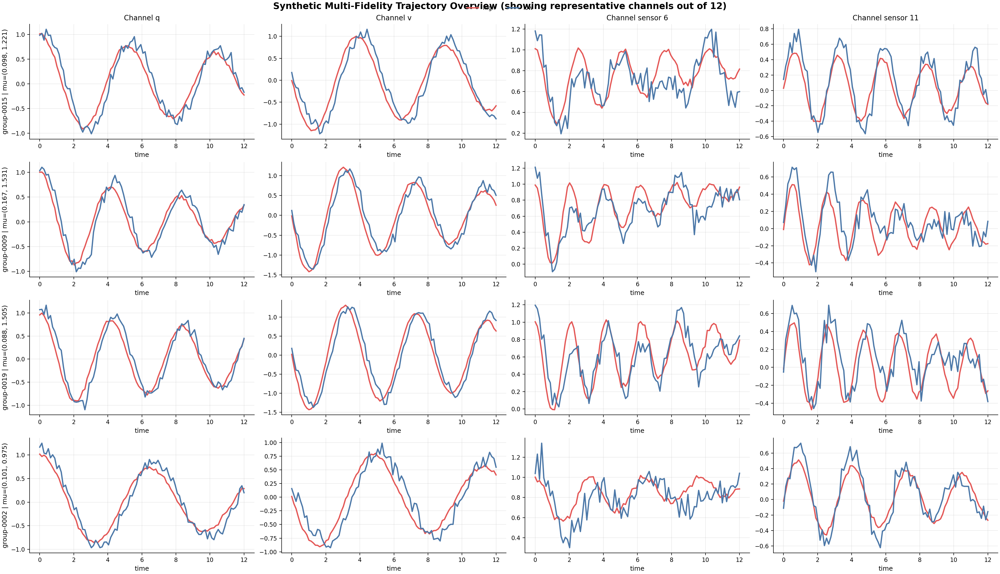

*Figure.* Coverage of the parameter domain across train, validation, and test groups.

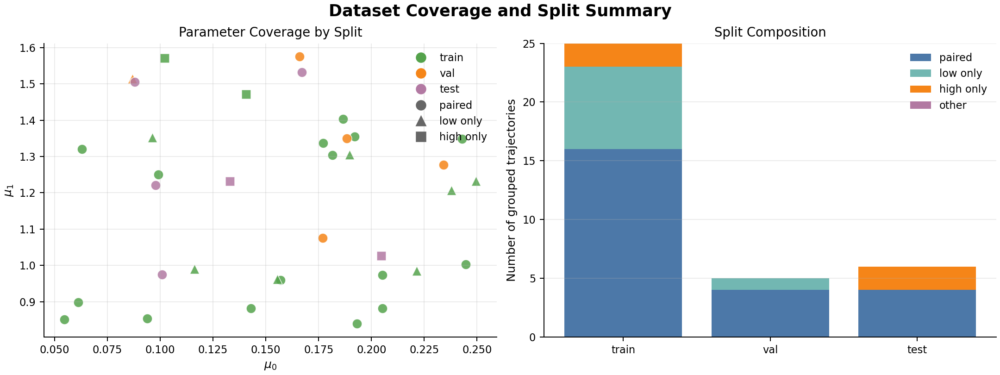

*Figure.* Optimization traces for total loss, component losses, per-fidelity error, and curriculum weights.

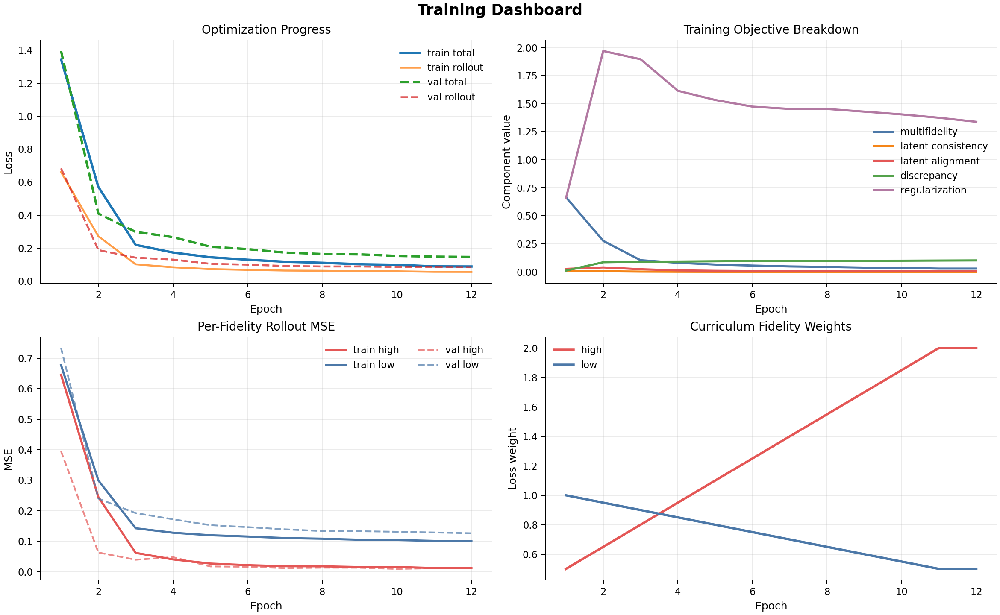

*Figure.* Short-horizon rollouts from windowed initial conditions.

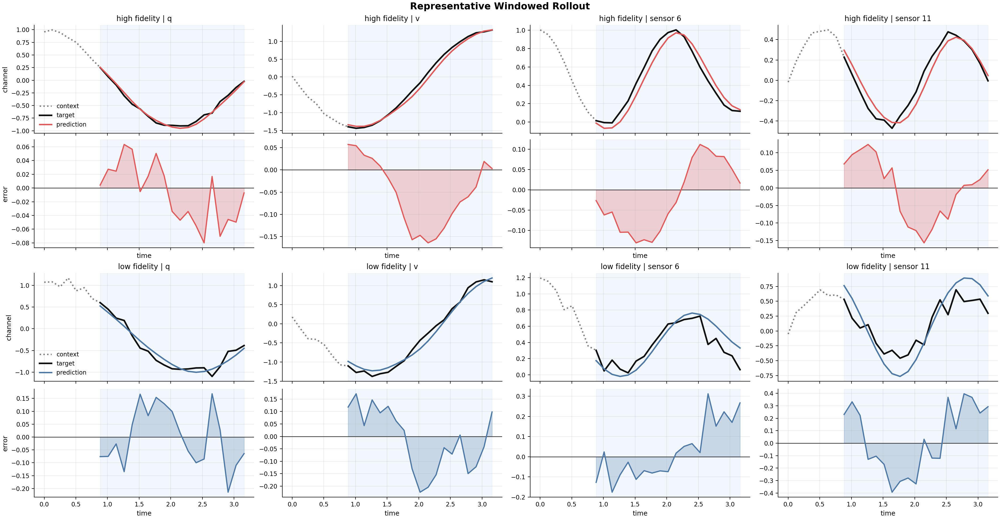

*Figure.* Longer-horizon trajectory reconstruction for a representative test case.

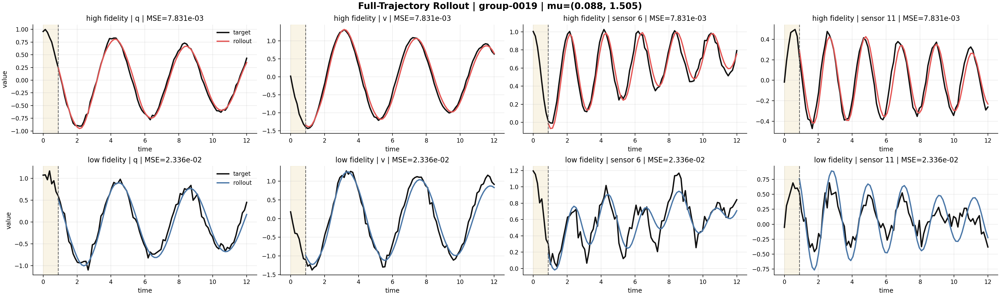

*Figure.* Evolution of rollout error over prediction time.

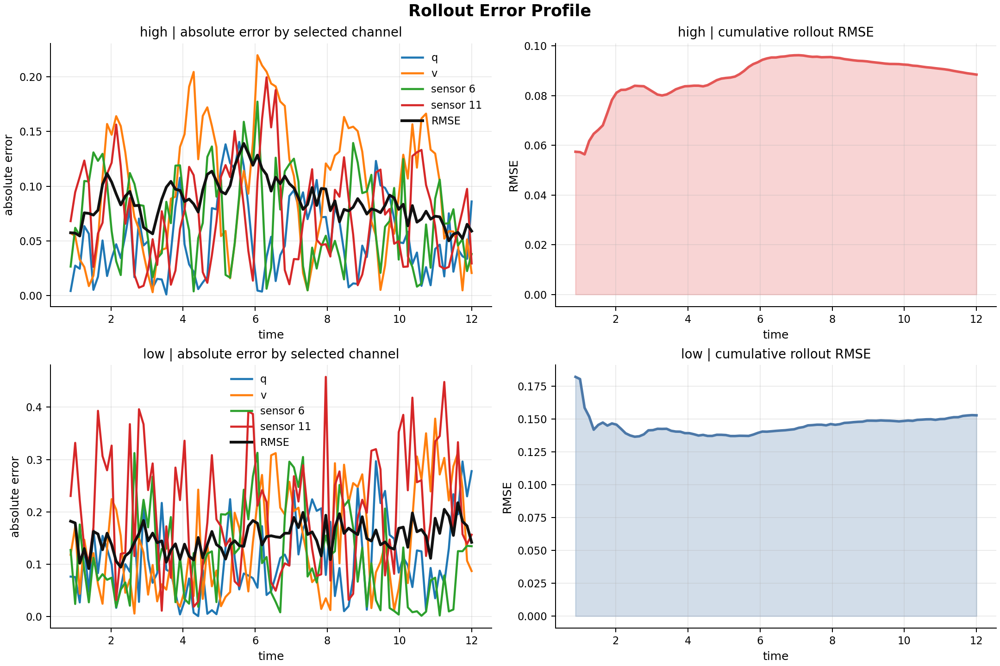

*Figure.* Observed and predicted low-to-high fidelity gap for a representative test case.

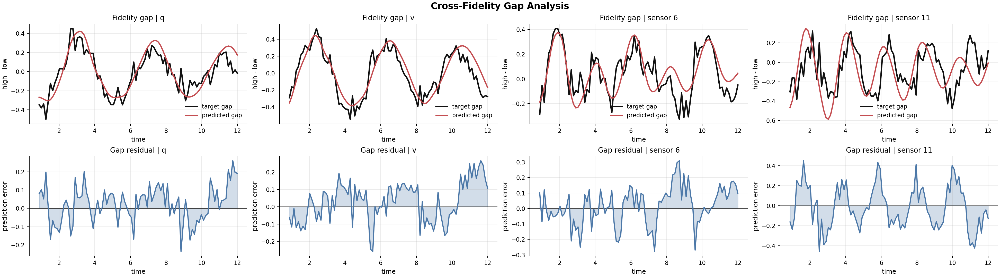

*Figure.* Latent phase portraits, latent norms, and cross-fidelity latent distance.

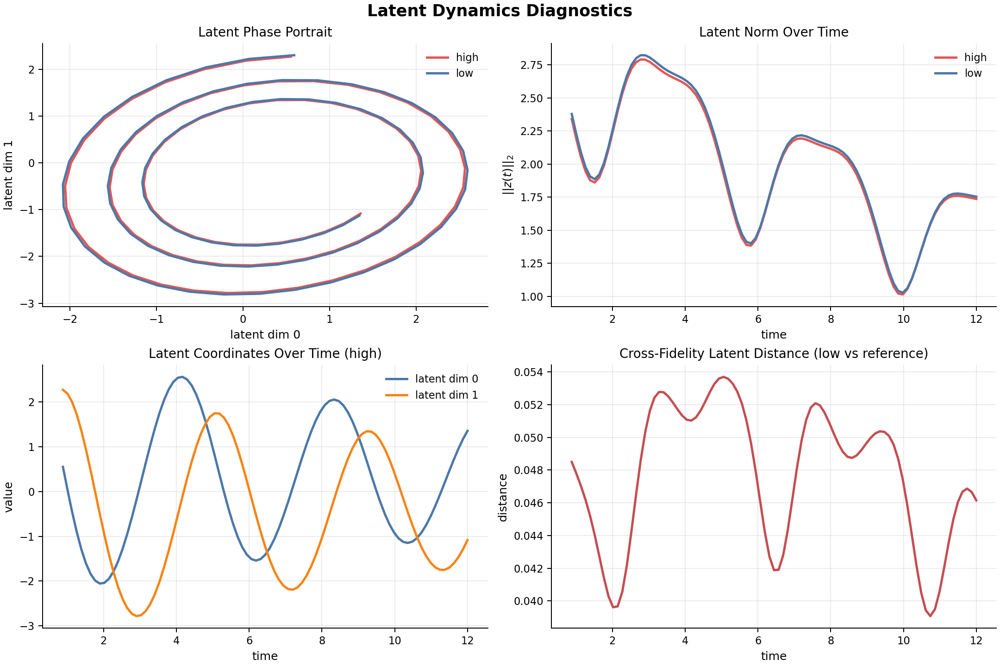

*Figure.* Summary of held-out scalar metrics for Study I.

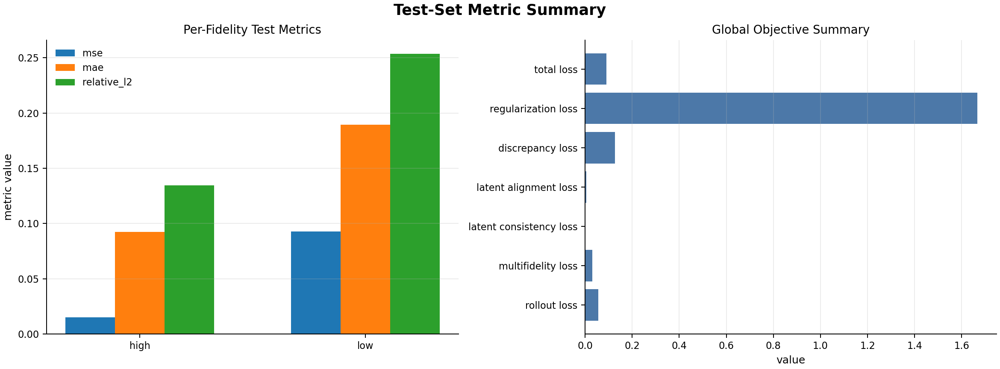

**Table 1.** Held-out metrics for Study I.

| Metric | Value |
|---|---:|
| `discrepancy_loss` | 0.126699 |
| `high/mae` | 0.092461 |
| `high/mse` | 0.015115 |
| `high/relative_l2` | 0.134468 |
| `latent_alignment_loss` | 0.005819 |
| `latent_consistency_loss` | 0.000672 |
| `low/mae` | 0.189466 |
| `low/mse` | 0.092693 |
| `low/relative_l2` | 0.253505 |
| `multifidelity_loss` | 0.031335 |
| `regularization_loss` | 1.665842 |
| `rollout_loss` | 0.055665 |
| `total_loss` | 0.090338 |

In [5]:
display_figure_group(
    SYNTHETIC_OUTPUT,
    [
        ("06_dataset_overview.png", "Held-out grouped trajectories and split composition for Study I."),
        ("07_parameter_coverage.png", "Coverage of the parameter domain across train, validation, and test groups."),
        ("08_training_dashboard.png", "Optimization traces for total loss, component losses, per-fidelity error, and curriculum weights."),
        ("09_window_rollout.png", "Short-horizon rollouts from windowed initial conditions."),
        ("10_full_trajectory_rollout.png", "Longer-horizon trajectory reconstruction for a representative test case."),
        ("11_rollout_error_profile.png", "Evolution of rollout error over prediction time."),
        ("12_fidelity_gap.png", "Observed and predicted low-to-high fidelity gap for a representative test case."),
        ("13_latent_diagnostics.png", "Latent phase portraits, latent norms, and cross-fidelity latent distance."),
        ("14_test_metrics.png", "Summary of held-out scalar metrics for Study I."),
    ],
    width=1100,
)
display(Markdown("**Table 1.** Held-out metrics for Study I."))
display(Markdown(metrics_markdown(synthetic_metrics)))


### 6.5 Discussion of Study I

The main evidence in this study is not the scalar error alone. A scientifically convincing outcome is one in
which the model reconstructs both fidelities, maintains stable rollout behavior, and preserves close latent
trajectories for paired samples despite substantial nonlinear observation mismatch.

This study is also informative about the fidelity curriculum. If low fidelity dominates too strongly for too
long, high-fidelity reconstruction tends to remain underfit. If high fidelity is emphasized too early, the
representation-learning benefit of the abundant low-fidelity data is diminished. The most informative figures
for diagnosing this trade-off are the training dashboard, the fidelity-gap figure, and the latent
diagnostics.

The scientific scope of the result should remain limited. A successful outcome supports the shared latent
formulation under nonlinear measurement bias, but it does not yet establish that the learned latent
coordinates equal the true oscillator coordinates, nor does it establish readiness for spatially structured
coarse-to-fine transfer.


## 7. Study II: Different-Grid CFD-Like Fields

The second study moves from channel-based sensing to field-valued observations. The observed quantity is a
time-dependent two-dimensional scalar field with transport, wake-like oscillation, and parameter-dependent
deformation. Low and high fidelity correspond to the same evolving field evaluated on different spatial
grids, with additional distortion and smoothing at low fidelity.

This study is closer to the reduced-order modeling use case that motivates the library. It asks whether a
shared latent ROM can support coarse and fine outputs that live in genuinely different observation spaces.


### 7.1 Data Construction and Spatial Representation

Each field snapshot is generated on its own grid and then flattened into a vector before entering the model.
This design keeps the first implementation compatible with the same training abstractions used in Study I,
but it also exposes an important limitation: the model does not yet use spatial locality or grid topology as
an explicit inductive bias.

The study is therefore valuable for two reasons. It tests whether the current shared latent formulation is
coherent in a different-grid setting, and it reveals how much performance is already available before adding
explicitly spatial encoders, decoders, or transfer operators.

The concrete dataset specification used in the example is:

- `20` paired groups, `6` low-only groups, and `4` high-only groups
- advection parameter sampled uniformly from `[0.8, 1.6]`
- swirl parameter sampled uniformly from `[0.7, 1.4]`
- `72` uniform time samples on `[0, 10]`
- low-fidelity grid `16 x 16` and high-fidelity grid `32 x 32`
- additive Gaussian noise with standard deviation `0.015` for low fidelity and `0.004` for high fidelity

The field generator is synthetic but structured. Each snapshot is formed as a sum of several recognizable
components:

- a **leading vortex** with a parameter-dependent advected center and oscillatory internal structure
- a **recirculation bubble** downstream of that vortex
- a **wake mode** with downstream transport and transverse oscillation
- a **shear-layer interface** represented by a time-dependent `tanh` profile
- a weak **boundary mode** that decays in time

Low fidelity is not produced by mere coarse gridding of the same field. It is generated with explicit
structural bias: phase lag, stronger diffusion, lower amplitude, a shifted wake position, and an additional
nonlinear filtering step that combines `tanh` compression with spatial rolls in both coordinate directions.
Only after these fidelity-specific distortions are applied are the low- and high-fidelity snapshots flattened
into vectors of length `256` and `1024`, respectively.


In [6]:
run_example(
    "train_cfd_like_grids.py",
    CFD_OUTPUT,
    epochs=CFD_EPOCHS,
    quick=USE_QUICK_MODE,
    force=FORCE_RERUN,
)
cfd_metrics = load_metrics(CFD_OUTPUT)
display(Markdown("Artifacts for Study II are available."))


Reusing existing artifacts in /Users/filippozacchei/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Documenti/Projects/2026_MFSINDY2/mfaesindy/artifacts/notebook_cfd_like_grids


Artifacts for Study II are available.

*Figure.* Study II test problem: synthetic CFD-like field dynamics and representative coarse/fine observations.

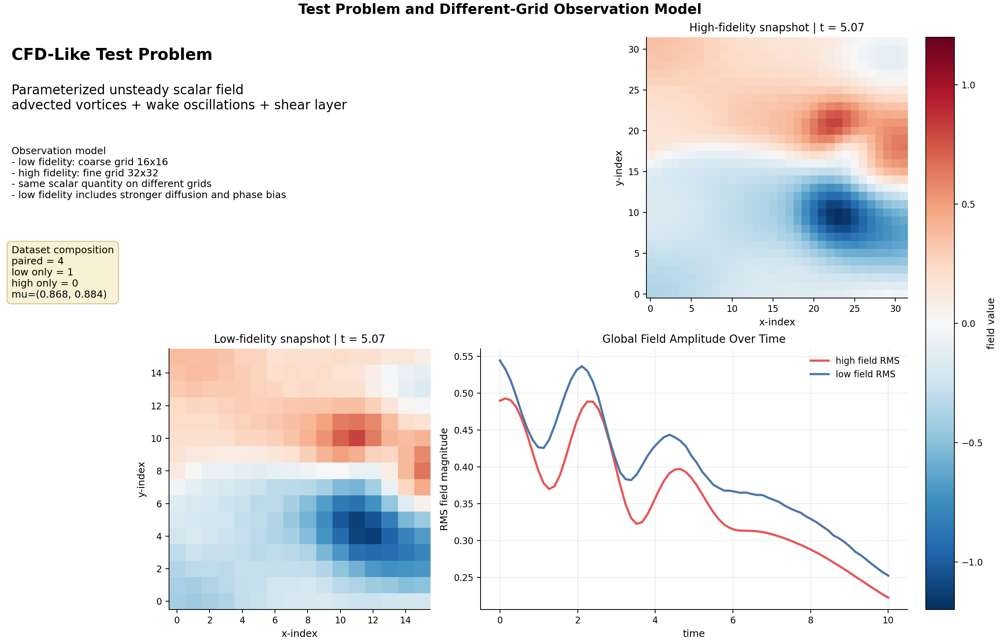

*Figure.* Study II measurement definition: different low- and high-fidelity grids and representative field snapshots.

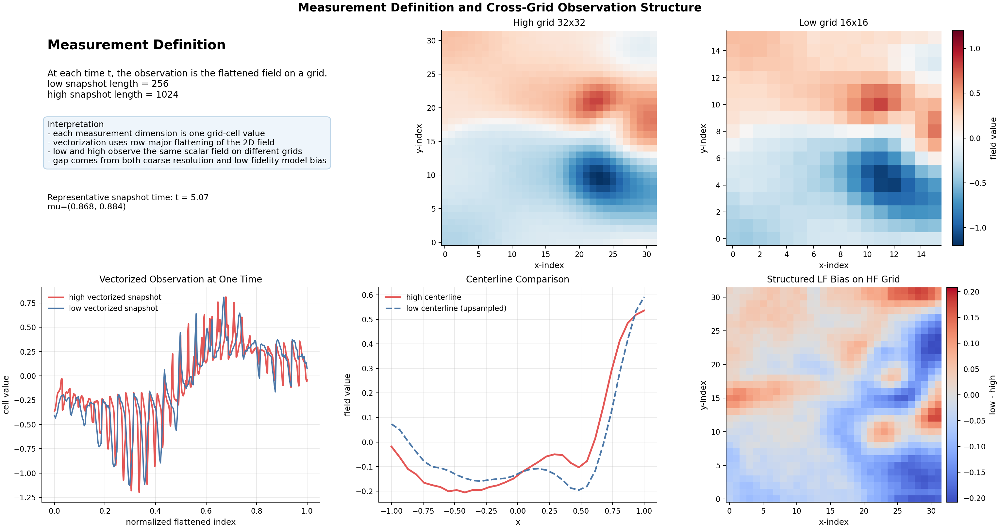

*Figure.* Shared latent rollout with fidelity-specific field reconstruction.

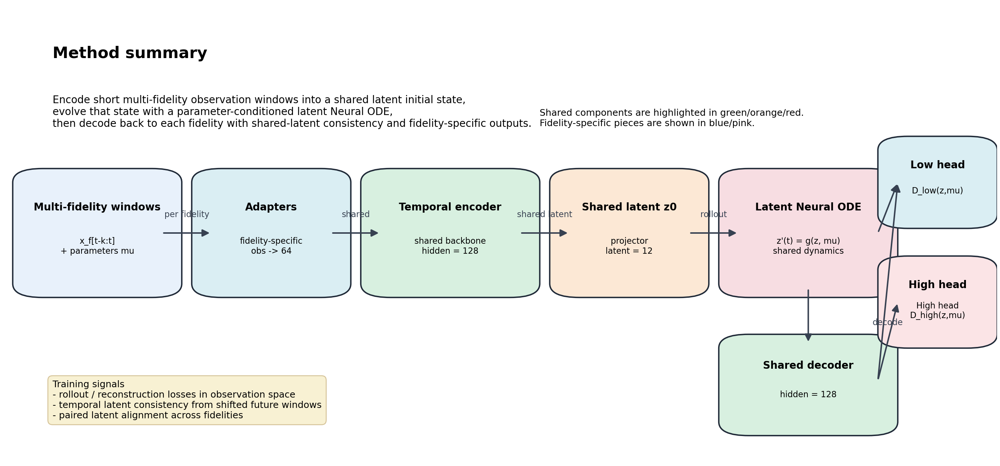

*Figure.* Architecture adapted to different output dimensions across fidelities.

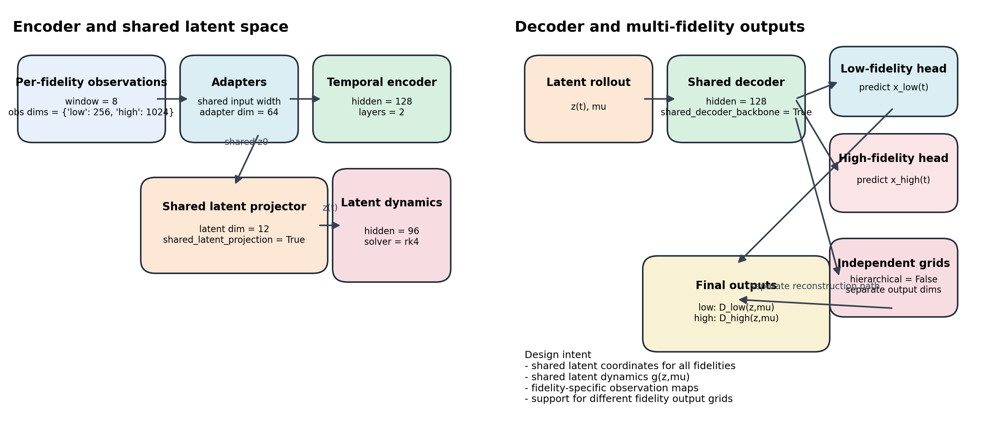

*Figure.* Optimization strategy and fidelity curriculum used in the field setting.

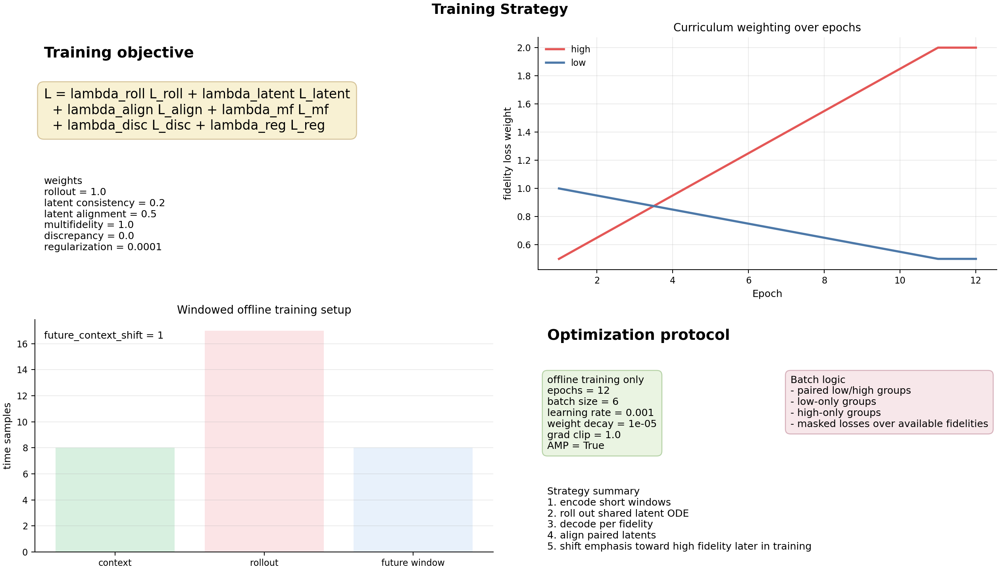

In [7]:
display_figure_group(
    CFD_OUTPUT,
    [
        ("01_test_problem.png", "Study II test problem: synthetic CFD-like field dynamics and representative coarse/fine observations."),
        ("02_measurement_overview.png", "Study II measurement definition: different low- and high-fidelity grids and representative field snapshots."),
        ("03_method_overview.png", "Shared latent rollout with fidelity-specific field reconstruction."),
        ("04_architecture_breakdown.png", "Architecture adapted to different output dimensions across fidelities."),
        ("05_training_strategy.png", "Optimization strategy and fidelity curriculum used in the field setting."),
    ],
    width=1100,
)


### 7.2 Interpretation of the Setup Figures

The critical difference from Study I is that low and high fidelity no longer share the same observation
dimension. The decoder is therefore not merely compensating for measurement bias; it is reconstructing the
same latent trajectory into different spatial discretizations.

A successful result in this setting should not be over-interpreted. It would not imply that spatial transfer
is solved. It would imply that the present multifidelity latent formulation is coherent enough to justify
subsequent investment in stronger spatial inductive bias.


### 7.3 Results

The result figures for Study II should be interpreted more visually than those of Study I. Field coherence,
long-horizon stability, and the structure of the coarse-to-fine fidelity gap are at least as important as
aggregate scalar metrics. The latent diagnostics again provide a direct view into whether the shared latent
dynamics remain stable across fidelities in this more demanding setting.


#### Forecasting Capability in Study II

The field example uses a context window of length `8` and a training rollout horizon of `16`. As in Study I,
the short-horizon rollout therefore represents the regime directly optimized during training. The
full-trajectory rollout is more demanding: the first context window is encoded once, and the model then
predicts the rest of the coarse-grid and fine-grid trajectory in open loop.

This is a stronger forecasting test than in the sensing example because two difficulties are coupled
together. The latent dynamics must remain stable over time, and the decoder must continue to reconstruct
meaningful fields on two different grids from the same latent trajectory. A plausible forecast is therefore
one that preserves coherent field structure at both fidelities while keeping the cross-grid relationship
interpretable.

The rollout error profile is especially informative here because scalar averages can hide how forecast
quality changes with time. The profile reveals whether errors grow gradually, plateau, or accelerate. The
cross-grid fidelity-gap figure adds a stricter criterion still: whether the coarse-to-fine discrepancy
pattern is preserved during forecasting rather than only the individual field amplitudes.


*Figure.* Held-out grouped field trajectories and split composition for Study II.

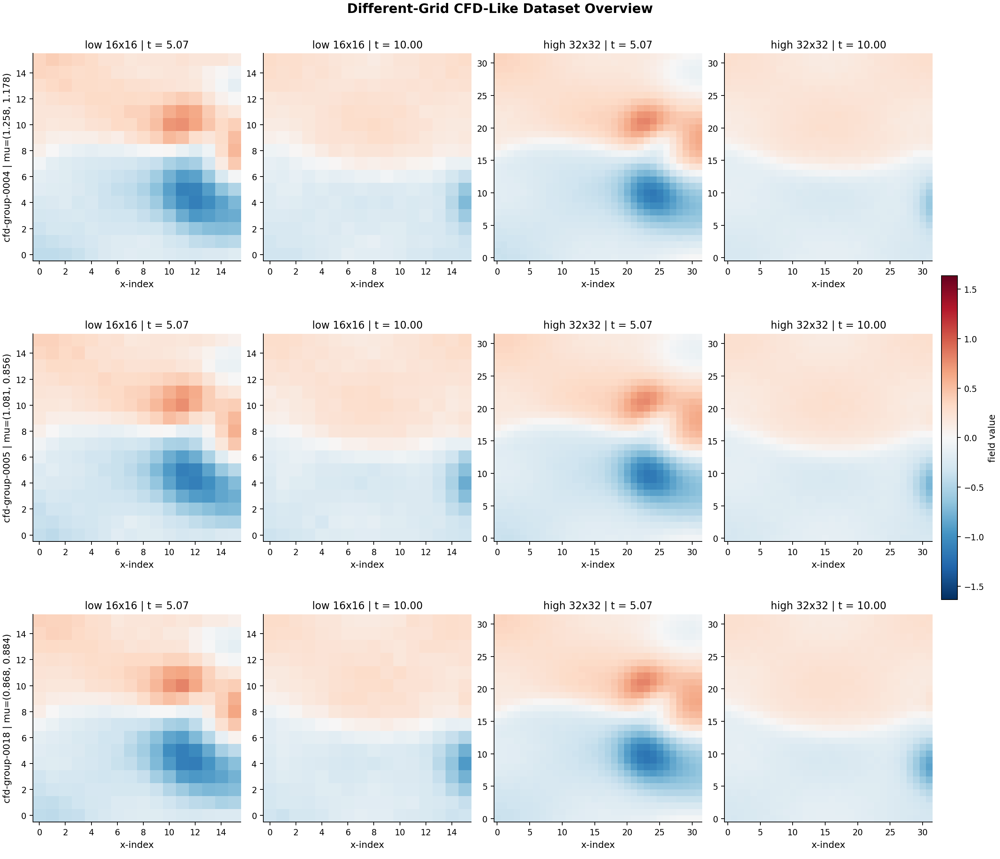

*Figure.* Coverage of the parameter domain for the field problem.

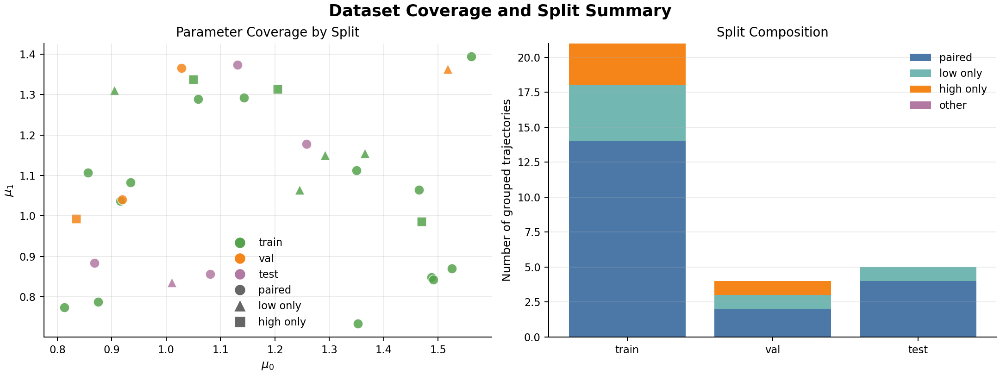

*Figure.* Optimization traces for the field setting.

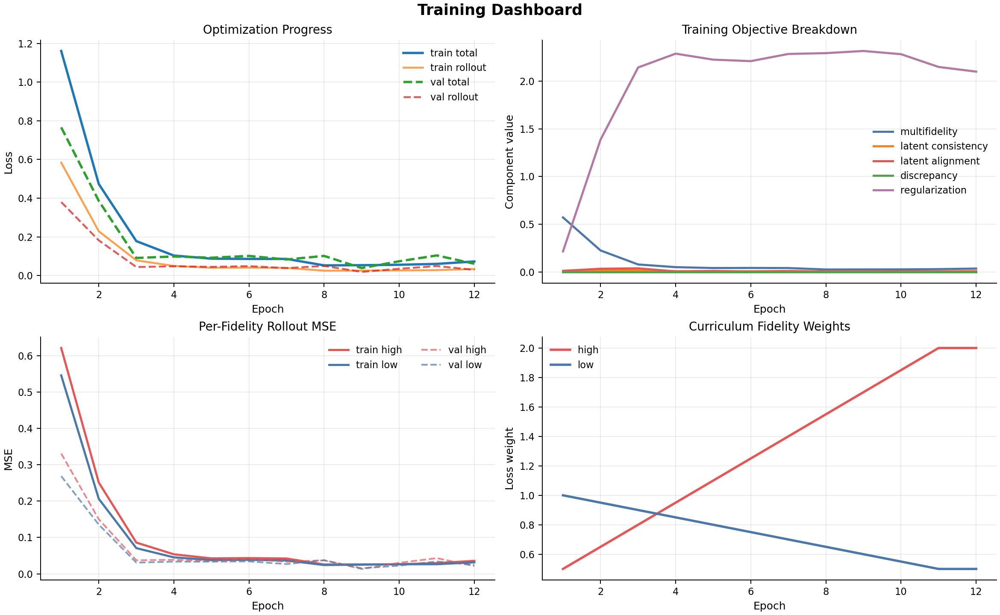

*Figure.* Short-horizon field rollouts from windowed initial conditions.

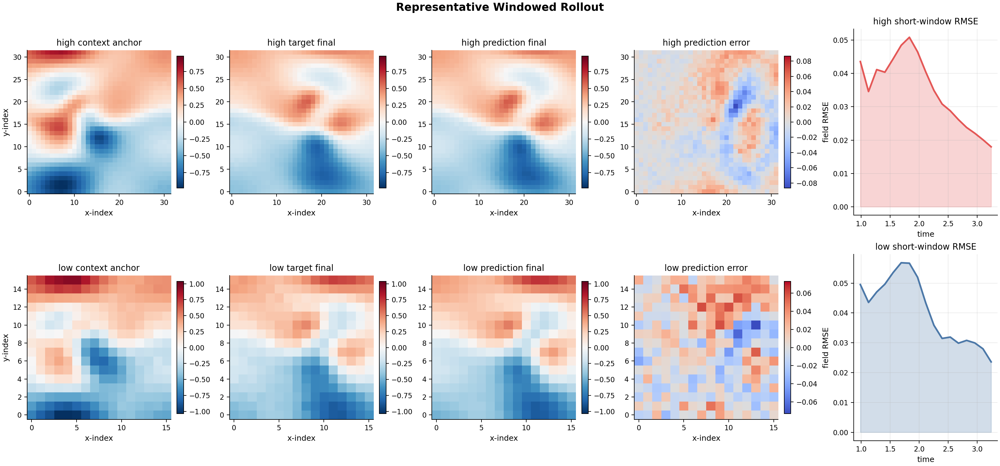

*Figure.* Longer-horizon field reconstruction for a representative coarse/fine pair.

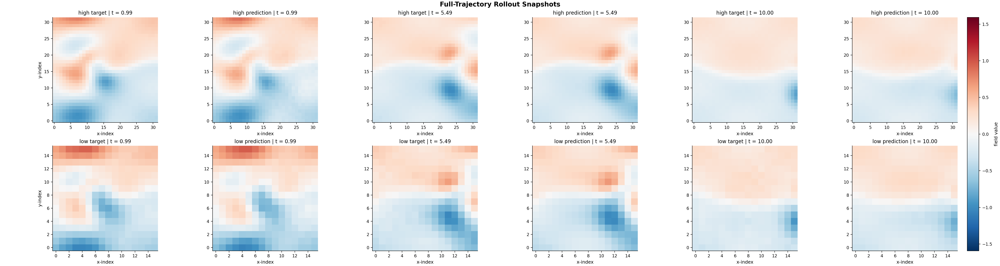

*Figure.* Evolution of field rollout error over prediction time.

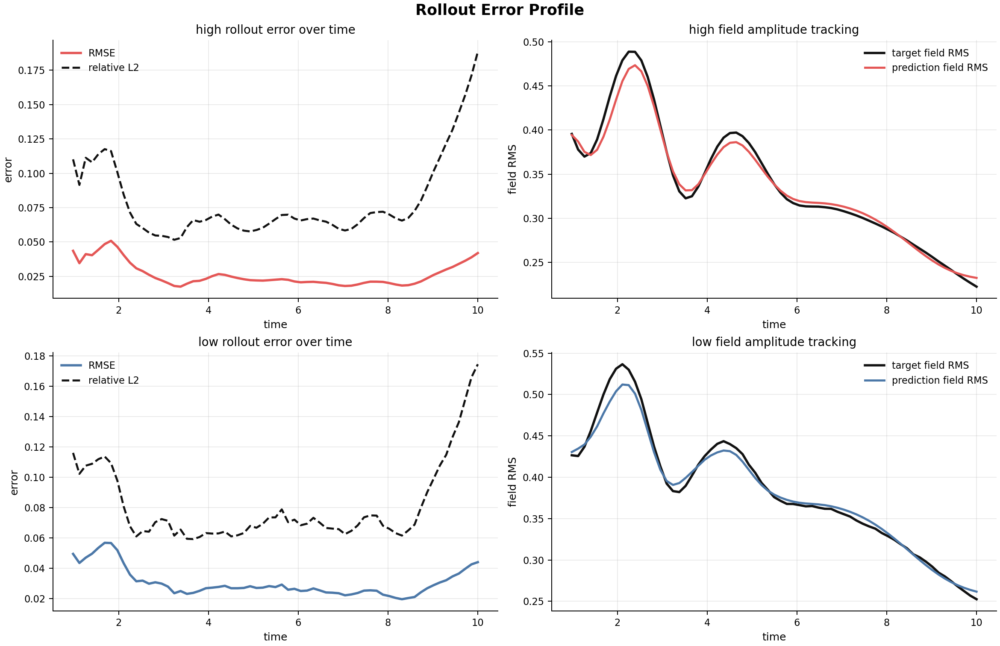

*Figure.* Observed and predicted cross-grid fidelity gap.

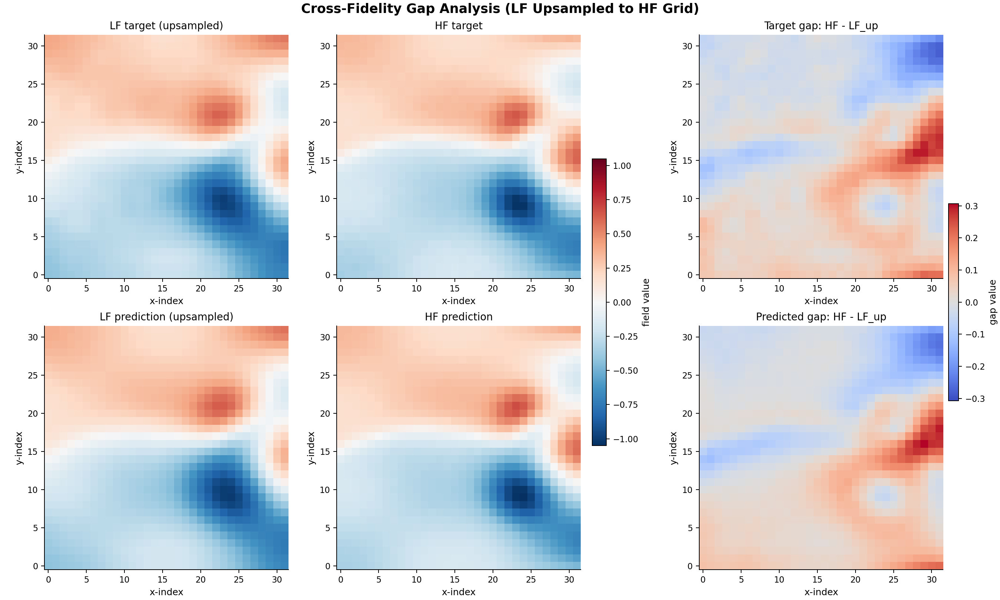

*Figure.* Latent phase portraits, latent norms, and cross-fidelity latent distance in Study II.

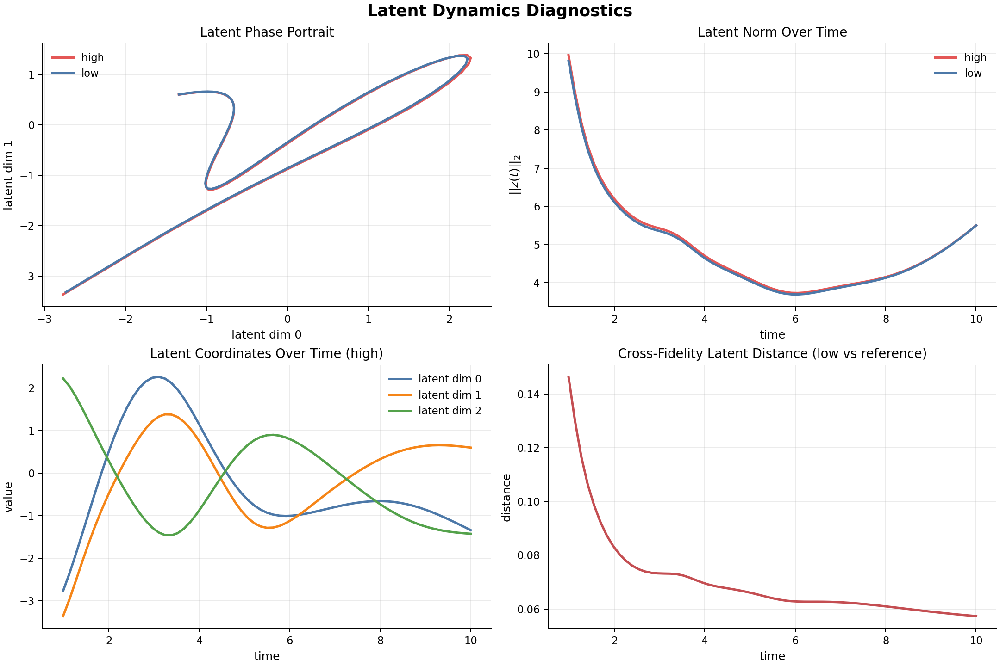

*Figure.* Summary of held-out scalar metrics for Study II.

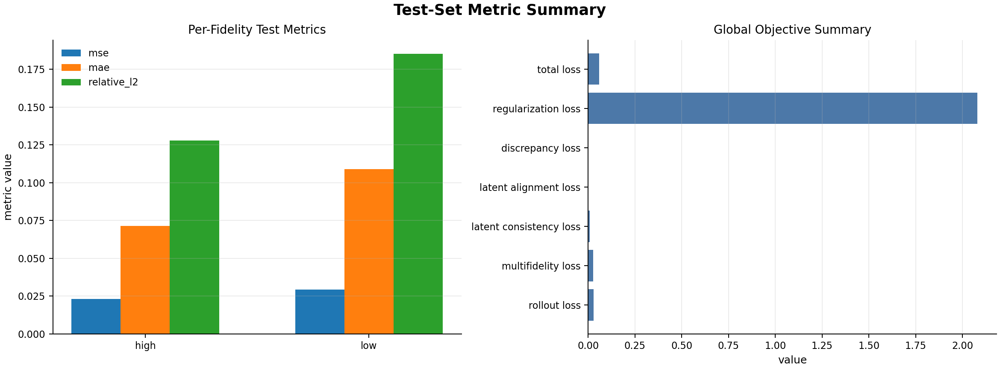

**Table 2.** Held-out metrics for Study II.

| Metric | Value |
|---|---:|
| `discrepancy_loss` | 0.000000 |
| `high/mae` | 0.071482 |
| `high/mse` | 0.023036 |
| `high/relative_l2` | 0.127994 |
| `latent_alignment_loss` | 0.001166 |
| `latent_consistency_loss` | 0.009173 |
| `low/mae` | 0.108964 |
| `low/mse` | 0.029389 |
| `low/relative_l2` | 0.185166 |
| `multifidelity_loss` | 0.027572 |
| `regularization_loss` | 2.078826 |
| `rollout_loss` | 0.028254 |
| `total_loss` | 0.058451 |

In [8]:
display_figure_group(
    CFD_OUTPUT,
    [
        ("06_dataset_overview.png", "Held-out grouped field trajectories and split composition for Study II."),
        ("07_parameter_coverage.png", "Coverage of the parameter domain for the field problem."),
        ("08_training_dashboard.png", "Optimization traces for the field setting."),
        ("09_window_rollout.png", "Short-horizon field rollouts from windowed initial conditions."),
        ("10_full_trajectory_rollout.png", "Longer-horizon field reconstruction for a representative coarse/fine pair."),
        ("11_rollout_error_profile.png", "Evolution of field rollout error over prediction time."),
        ("12_fidelity_gap.png", "Observed and predicted cross-grid fidelity gap."),
        ("13_latent_diagnostics.png", "Latent phase portraits, latent norms, and cross-fidelity latent distance in Study II."),
        ("14_test_metrics.png", "Summary of held-out scalar metrics for Study II."),
    ],
    width=1100,
)
display(Markdown("**Table 2.** Held-out metrics for Study II."))
display(Markdown(metrics_markdown(cfd_metrics)))


### 7.4 Discussion of Study II

The most informative questions in this study are whether the reconstructed fields preserve coherent
large-scale structure, whether the cross-grid fidelity gap is systematic rather than random, and whether the
latent trajectories remain stable despite differing output dimensions. These criteria are more meaningful
than scalar error alone because they assess whether the latent reduced-order model is capturing the dominant
field evolution rather than only matching aggregate amplitudes.

The expected limitation is equally clear. Because the present model treats fields as flattened vectors, it
should not be expected to recover fine spatial structure as effectively as a properly spatial architecture.
The significance of a positive result is therefore methodological: it shows that the shared latent Neural ODE
abstraction survives the transition from high-dimensional sensing to different-grid field reconstruction.


## 8. Comparative Discussion

The two studies validate different parts of the methodology.

Study I is stronger evidence for the claim that low and high fidelity can share a latent coordinate system
even under severe observation bias. Study II is stronger evidence for the claim that the same latent
reduced-order dynamics can support different output spaces and therefore begin to address coarse/fine field
reconstruction.

From the perspective of forecasting, the two studies also answer different questions. Study I asks whether
the latent dynamics remain predictive when fidelity acts primarily through nonlinear measurement distortion.
Study II asks whether the same latent forecast can support multiple spatial discretizations over time. In
both studies, the current evidence is strongest for open-loop forecasting within the sampled parameter
distribution and weaker for claims about parameter extrapolation.

What neither study yet establishes is equally important. The current experiments do not provide baseline
comparisons, formal ablations, uncertainty estimates, mesh-aware transfer operators, or solver-generated CFD
validation. Consequently, the present evidence is best interpreted as internal scientific consistency rather
than as a claim of benchmark superiority.


## 9. Limitations and Research Directions

Several next steps are now well motivated by the present evidence.

1. **Cleaner scientific objective.** The loss should separate rollout fidelity, latent temporal consistency,
   cross-fidelity alignment, and decoder regularization more explicitly.
2. **Stronger spatial inductive bias.** The different-grid study already suggests that convolutional,
   coordinate-aware, or operator-style decoders would be a more valuable next investment than generic MLP
   expansion.
3. **Stronger evaluation.** Parameter-holdout reporting, systematic ablations, and baseline comparisons are
   needed before stronger empirical claims can be made.
4. **Transition to more realistic data.** Real solver-generated data will be most informative after the
   methodological and evaluative pieces above are stabilized.

In short, the next stage of the project should be driven by scientific clarification rather than by feature
accumulation.


## 10. Conclusion

The present `mf_lnode` package already embodies a coherent scientific formulation for multifidelity latent
reduced-order modeling from offline data. It provides explicit grouped-data abstractions, a shared latent
Neural ODE, fidelity-aware encoders and decoders, modular losses, and a reproducible experimental pipeline.
The two studies reported here indicate that the formulation is meaningful both when fidelity acts through
nonlinear measurement bias and when fidelity acts through different spatial discretizations.

The central conclusion is therefore measured but positive. The project is already beyond the stage of an
isolated coding exercise. However, the strongest future gains are unlikely to come from adding many new
mechanisms at once. They are more likely to come from refining the scientific formulation itself: clearer
objectives, stronger spatial structure, and more rigorous evaluation. Those changes would place the library
on firmer ground for subsequent work on realistic CFD data, transfer operators, and physics-informed
extensions.
